<a href="https://colab.research.google.com/github/jeyasri-s2/SJSU297-AdvancedDL/blob/master/Assignment2_DataAugmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Goal: Use cutout, Mixup, Label smoothing and test time augmentation with fastai library

## Dataset: dog Cat classifier

In [1]:
from fastai.vision import *

from fastai.imports import *



In [ ]:
from fastai.vision import *
from fastai.metrics import error_rate
from pathlib import Path
#Trick to solve ndim issue
torch.Tensor.ndim = property(lambda x: len(x.size()))

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")
#print(fastai.__version__)
print(torch.__version__)

1.6.0+cu101


In [ ]:
bs=24


In [ ]:
path = untar_data(URLs.DOGS)
URLs.DOGS

'http://files.fast.ai/data/examples/dogscats'

In [ ]:
path

PosixPath('/root/.fastai/data/dogscats')

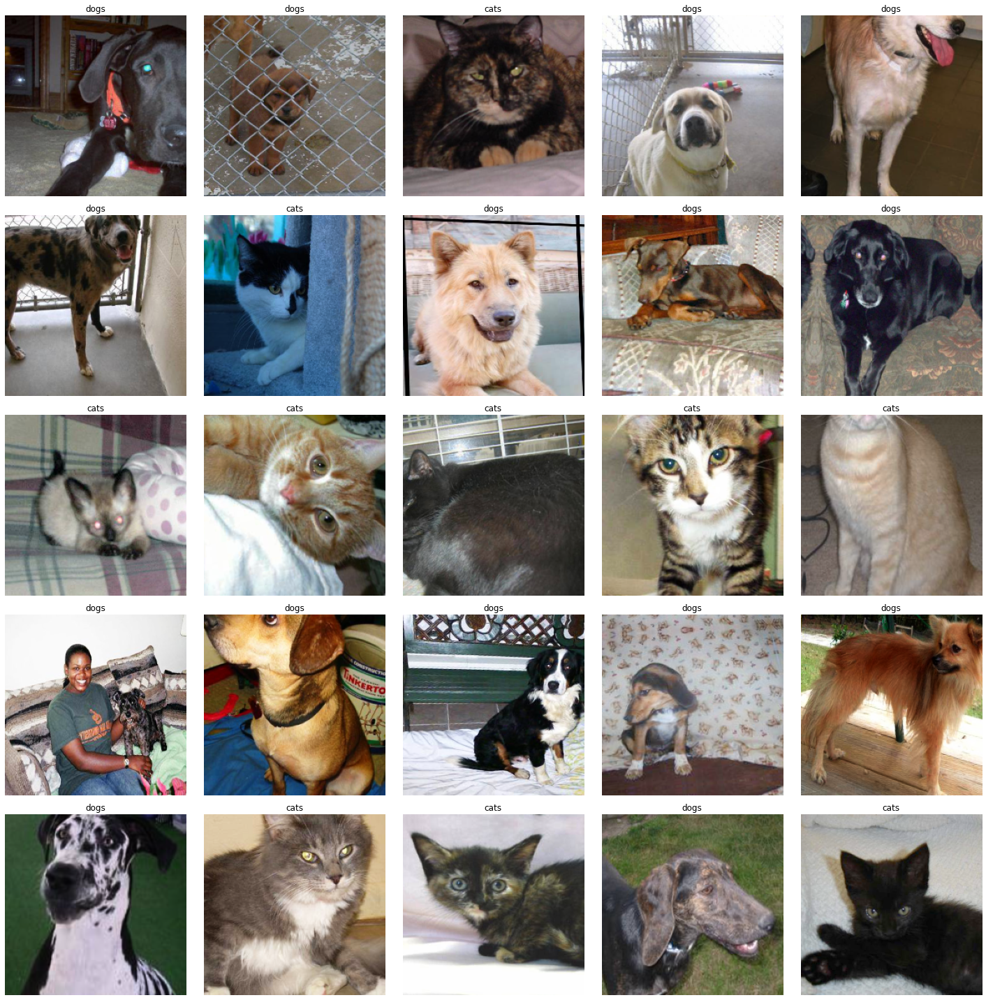

In [ ]:
data=ImageDataBunch.from_folder(path,train="train",valid="valid",ds_tfms=get_transforms(),size=224
 ).normalize(imagenet_stats)
data.show_batch()


In [ ]:
learn=cnn_learner(data,models.resnet34,metrics=accuracy)
learn.fit_one_cycle(1)


epoch,train_loss,valid_loss,accuracy,time
0,0.062500,0.029363,0.988500,02:32


In [ ]:
interp=ClassificationInterpretation.from_learner(learn)
losses,idxs=interp.top_losses()
interp.plot_top_losses(9,figsize=(15,11))

In [ ]:
#PATH = "data/dogscats/"
sz=224

# Cutout augumentation

In [ ]:
tfms = [cutout(n_holes=(1,4), length=(10, 120), p=1.),cutout(n_holes=(1,4), length=(10, 120), p=1.)]

In [ ]:
data

ImageDataBunch;

Train: LabelList (23000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
cats,cats,cats,cats,cats
Path: /root/.fastai/data/dogscats;

Valid: LabelList (2000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
cats,cats,cats,cats,cats
Path: /root/.fastai/data/dogscats;

Test: None

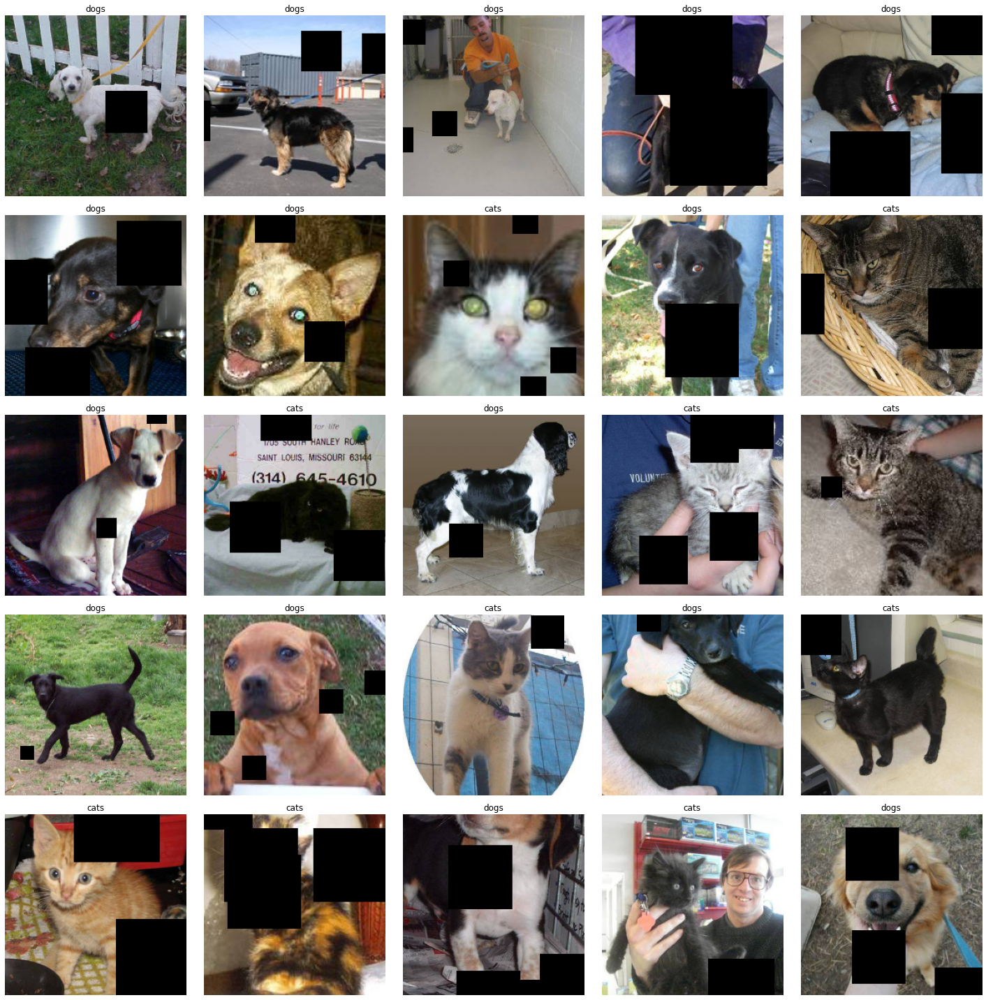

In [ ]:
data=ImageDataBunch.from_folder(path,train="train",valid="valid",ds_tfms=tfms,size=224).normalize(imagenet_stats)

data.show_batch()


In [ ]:
learn=cnn_learner(data,models.resnet34,metrics=accuracy)
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.111862,0.074445,0.968000,01:50


## Mixup augmentation

In [ ]:
learn = cnn_learner(data,models.resnet34,metrics=accuracy).mixup()
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.345330,0.132870,0.961000,01:54


# Label smoothing

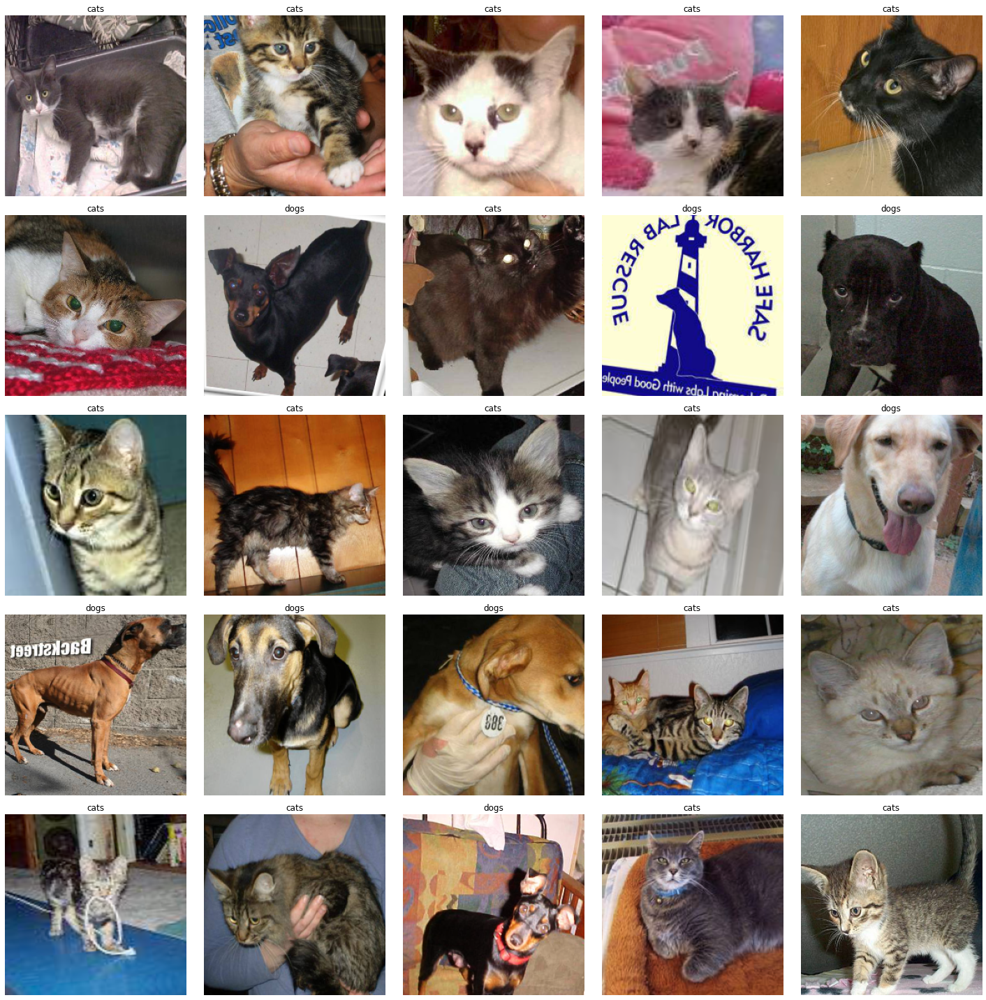

In [ ]:
data=ImageDataBunch.from_folder(path,train="train",valid="valid",ds_tfms=get_transforms(),size=224).normalize(imagenet_stats)

data.show_batch()

In [ ]:
learn = cnn_learner(data,models.resnet34,metrics=accuracy,loss_func=LabelSmoothingCrossEntropy())
learn.fit_one_cycle(1)
 
 

epoch,train_loss,valid_loss,accuracy,time
0,0.252392,0.229835,0.988500,02:33


## Label smoothing and mixup

In [ ]:

learn = cnn_learner(data,models.resnet34,metrics=accuracy,loss_func=LabelSmoothingCrossEntropy()).mixup()
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.429579,0.283740,0.962500,01:52


## Label smoothing, mixup and cutout

In [ ]:
data=ImageDataBunch.from_folder(path,train="train",valid="valid",ds_tfms=tfms,size=224).normalize(imagenet_stats)

data.show_batch()

In [ ]:
learn = cnn_learner(data,models.resnet34,metrics=accuracy,loss_func=LabelSmoothingCrossEntropy()).mixup()
learn.fit_one_cycle(1)

# Test time augmentation

In [ ]:
import torchvision.transforms as transforms
import torchvision.datasets as datasets

In [ ]:
valdir = path/'valid'


In [ ]:
# TTA Augmentations
target_size = 128
min_scale = 0.5
trn_tfms = [transforms.RandomResizedCrop(target_size, scale=(min_scale, 1.0)),
            transforms.RandomHorizontalFlip()]
tta_aug_dataset = datasets.ImageFolder(valdir, transforms.Compose(trn_tfms))

In [ ]:
tta_aug_dataset

Dataset ImageFolder
    Number of datapoints: 2000
    Root location: /root/.fastai/data/dogscats/valid
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(128, 128), scale=(0.5, 1.0), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               RandomHorizontalFlip(p=0.5)
           )

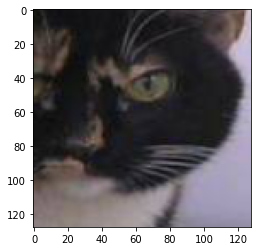

In [ ]:
plt.imshow(tta_aug_dataset[7][0])

In [ ]:
tta_aug_data=ImageDataBunch.from_folder(path,train="train",valid="valid",ds_tfms=tfms,size=224).normalize(imagenet_stats)
#tta_aug_data.show_batch()

In [ ]:
learn = cnn_learner(tta_aug_data,models.resnet34,metrics=accuracy,loss_func=LabelSmoothingCrossEntropy()).mixup()
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.431162,0.282116,0.960500,01:51
